## INDIA AIR QUALITY DATA ANALYSIS, VISUALISATION AND PREDICTION

The Air Quality Index (AQI) is a statistic for assessing the quality of the air in our immediate surroundings. It measures how air pollution can affect an individual’s health within a specified period of time. The common air pollutants are Particulate Matter (PM2.5, PM10), Nitrogen Dioxide (NO2) Carbon Monoxide (CO), Sulphur Dioxide (SO2) and Ozone (O3).This project was to evaluate and investigate condition and quality of the air by measuring Air Quality Index (AQI) for the development of environment. This study was carried out based on measuring four major air pollutants such as PM10, PM2.5, SO2 and NO2 with various ambiance conditions during January 2015 to July 2020 After a preliminary study of the available algorithms and data review, it became apparent that the problem fell under the linear regression category. The major discovery is that the machine learning approach should be suitable for these types of problems due to many aspects. We developed a model to predict the air quality index based on historical data of previous years and predicting over a particular upcoming year as a Gradient decent boosted multivariable regression problem

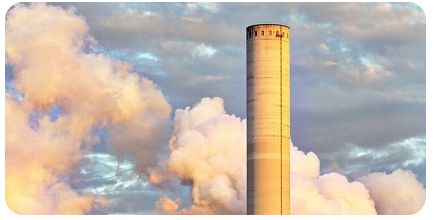

### ▶️Step 1) Importing necessary Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
from datetime import datetime
import warnings
warnings.filterwarnings("ignore")

In [2]:
from pywaffle import Waffle
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
from bubbly.bubbly import bubbleplot

### ▶️Step 2) Reading and Understanding the Data

In [73]:
df=pd.read_csv("C:/Users/HP/Documents/Eduverse topics/Reg_ML/city_day.csv",parse_dates=True)

In [74]:
df['Date']=pd.to_datetime(df['Date'])

In [75]:
df.head()

,City,Date,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01,NaN,NaN,0.92,18.22,17.15,NaN,0.92,27.64,133.36,0.00,0.02,0.00,NaN,NaN
1,Ahmedabad,2015-01-02,NaN,NaN,0.97,15.69,16.46,NaN,0.97,24.55,34.06,3.68,5.50,3.77,NaN,NaN
2,Ahmedabad,2015-01-03,NaN,NaN,17.40,19.30,29.70,NaN,17.40,29.07,30.70,6.80,16.40,2.25,NaN,NaN
3,Ahmedabad,2015-01-04,NaN,NaN,1.70,18.48,17.97,NaN,1.70,18.59,36.08,4.43,10.14,1.00,NaN,NaN
4,Ahmedabad,2015-01-05,NaN,NaN,22.10,21.42,37.76,NaN,22.10,39.33,39.31,7.01,18.89,2.78,NaN,NaN


In [76]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29531 entries, 0 to 29530
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   City        29531 non-null  object        
 1   Date        29531 non-null  datetime64[ns]
 2   PM2.5       24933 non-null  float64       
 3   PM10        18391 non-null  float64       
 4   NO          25949 non-null  float64       
 5   NO2         25946 non-null  float64       
 6   NOx         25346 non-null  float64       
 7   NH3         19203 non-null  float64       
 8   CO          27472 non-null  float64       
 9   SO2         25677 non-null  float64       
 10  O3          25509 non-null  float64       
 11  Benzene     23908 non-null  float64       
 12  Toluene     21490 non-null  float64       
 13  Xylene      11422 non-null  float64       
 14  AQI         24850 non-null  float64       
 15  AQI_Bucket  24850 non-null  object        
dtypes: datetime64[ns](1), 

In [77]:
df.describe()

,PM2.5,PM10,NO,NO2,NOx,NH3,CO,SO2,O3,Benzene,Toluene,Xylene,AQI
count,24933.000000,18391.000000,25949.000000,25946.000000,25346.000000,19203.000000,27472.000000,25677.000000,25509.000000,23908.000000,21490.000000,11422.000000,24850.000000
mean,67.450578,118.127103,17.574730,28.560659,32.309123,23.483476,2.248598,14.531977,34.491430,3.280840,8.700972,3.070128,166.463581
std,64.661449,90.605110,22.785846,24.474746,31.646011,25.684275,6.962884,18.133775,21.694928,15.811136,19.969164,6.323247,140.696585
min,0.040000,0.010000,0.020000,0.010000,0.000000,0.010000,0.000000,0.010000,0.010000,0.000000,0.000000,0.000000,13.000000
25%,28.820000,56.255000,5.630000,11.750000,12.820000,8.580000,0.510000,5.670000,18.860000,0.120000,0.600000,0.140000,81.000000
50%,48.570000,95.680000,9.890000,21.690000,23.520000,15.850000,0.890000,9.160000,30.840000,1.070000,2.970000,0.980000,118.000000
75%,80.590000,149.745000,19.950000,37.620000,40.127500,30.020000,1.450000,15.220000,45.570000,3.080000,9.150000,3.350000,208.000000
max,949.990000,1000.000000,390.680000,362.210000,467.630000,352.890000,175.810000,193.860000,257.730000,455.030000,454.850000,170.370000,2049.000000


In [78]:
grp_state=df.groupby(['City'])

In [79]:
def impute_mean_by_state(series):
    return series.fillna(series.mean())

In [80]:
df['PM2.5']=grp_state['PM2.5'].transform(impute_mean_by_state)  #fill value with mean value group by state
df['PM10']=grp_state['PM10'].transform(impute_mean_by_state)
df['NO2']=grp_state['NO2'].transform(impute_mean_by_state)
df['NO']=grp_state['NO'].transform(impute_mean_by_state)
df['NOx']=grp_state['NOx'].transform(impute_mean_by_state)
df['NH3']=grp_state['NH3'].transform(impute_mean_by_state)  #fill value with mean value group by state
df['CO']=grp_state['CO'].transform(impute_mean_by_state)
df['SO2']=grp_state['SO2'].transform(impute_mean_by_state)
df['O3']=grp_state['O3'].transform(impute_mean_by_state)
df['Benzene']=grp_state['Benzene'].transform(impute_mean_by_state)
df['Toluene']=grp_state['Toluene'].transform(impute_mean_by_state)
df['Xylene']=grp_state['Xylene'].transform(impute_mean_by_state)
df['AQI']=grp_state['AQI'].transform(impute_mean_by_state)

In [81]:
AQI_levels=pd.DataFrame(df['AQI_Bucket'].value_counts()).to_dict()['AQI_Bucket']

In [82]:
AQI_levels

{'Moderate': 8829,
 'Satisfactory': 8224,
 'Poor': 2781,
 'Very Poor': 2337,
 'Good': 1341,
 'Severe': 1338}

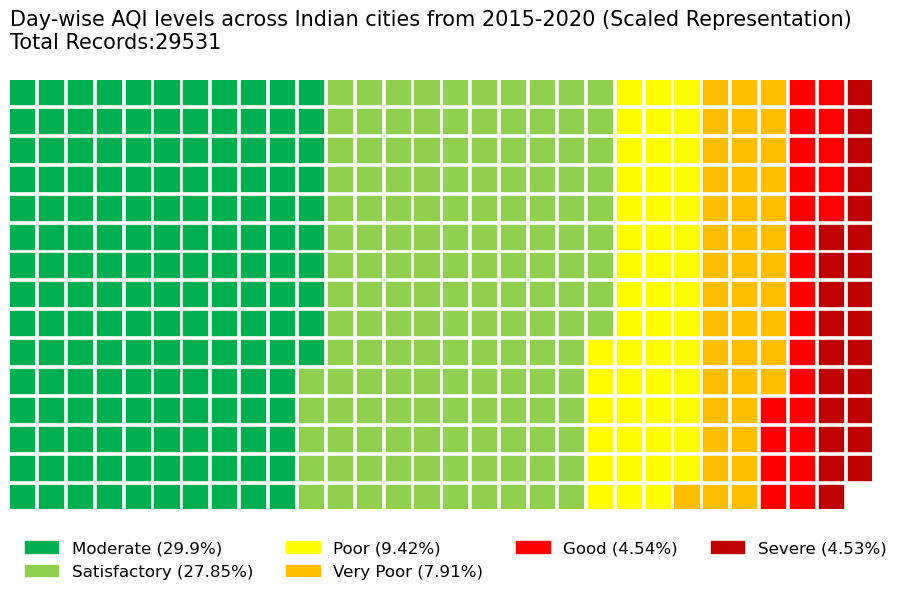

In [83]:
# plot
fig = plt.figure(
    title={
        'label': 'Day-wise AQI levels across Indian cities from 2015-2020 (Scaled Representation)\nTotal Records:29531\n',
        'loc': 'left',
        'fontdict': {
            'fontsize': 15,
        }
    },
    FigureClass=Waffle, 
    rows=15, 
    columns=30,
    values=AQI_levels, 
    colors=['#00b050', '#91cf4f', "#fefe00", "#ffbf00", "#fe0000", "#bf0000"],
    labels=[f"{k} ({round((v/df.shape[0]*100),2)}%)" for k, v in AQI_levels.items()],
    #legend={'loc': 'upper left', 'bbox_to_anchor': (1.1, 1)},
    legend={
        # 'labels': [f"{k} ({v}%)" for k, v in data.items()],  # lebels could also be under legend instead
        'loc': 'lower left',
        'bbox_to_anchor': (0, -0.2),
        'ncol': 4,
        'framealpha': 0,
        'fontsize': 12
    },
    block_arranging_style='style',
    figsize=(10, 20),
    starting_location='NW',
    vertical=False,
)
# show plot
plt.show()

### ▶️Step 3) Exploratory Data Analysis (EDA)

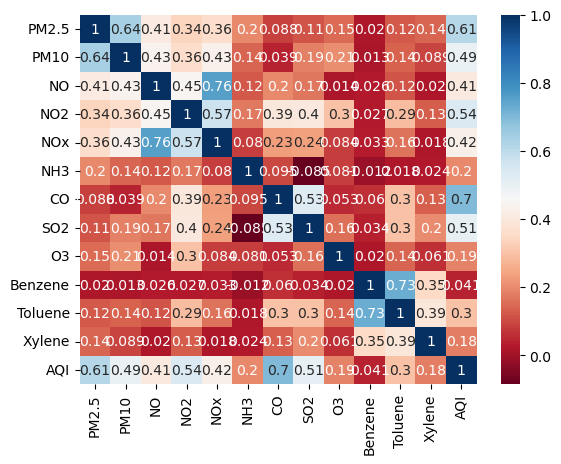

In [84]:
sns.heatmap(df.corr(), annot=True, cmap='RdBu')   # due to high corr e remove 
plt.show()


In [27]:
df.isnull().sum()   #Toluene  #NOx remove

City              0
Date              0
PM2.5             0
PM10           2009
NO                0
NO2               0
NOx            1169
NH3            2009
CO                0
SO2               0
O3              162
Benzene        2732
Toluene        4010
Xylene        13047
AQI               0
AQI_Bucket     4681
dtype: int64

In [28]:
df.drop(columns=['Toluene','NOx'],inplace=True)

In [29]:
data_state_Wise= pd.DataFrame(df['City'].value_counts()).sort_values(by='City', ascending=True).to_dict()['City']

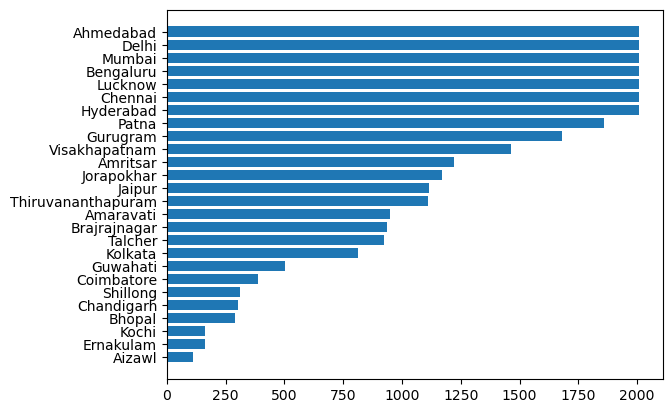

In [30]:
keys = data_state_Wise.keys()
values = data_state_Wise.values()
plt.barh(list(keys), list(values))
plt.show()

In [31]:
fig_hist=px.histogram(title='City wise AQI Bucket level',x=df['City'],color=df['AQI_Bucket'])
fig_hist.update_layout(
                       width=1200,
                       height=1200)
fig_hist.show()

In [32]:
count= df.groupby(['City','AQI_Bucket']).count().reset_index()

In [33]:
good=count.loc[count['AQI_Bucket']=='Good']
Moderate=count.loc[count['AQI_Bucket']=='Moderate']
Poor=count.loc[count['AQI_Bucket']=='Poor']
Satisfactory=count.loc[count['AQI_Bucket']=='Satisfactory']
Severe=count.loc[count['AQI_Bucket']=='Severe']
Very_Poor=count.loc[count['AQI_Bucket']=='Very Poor']

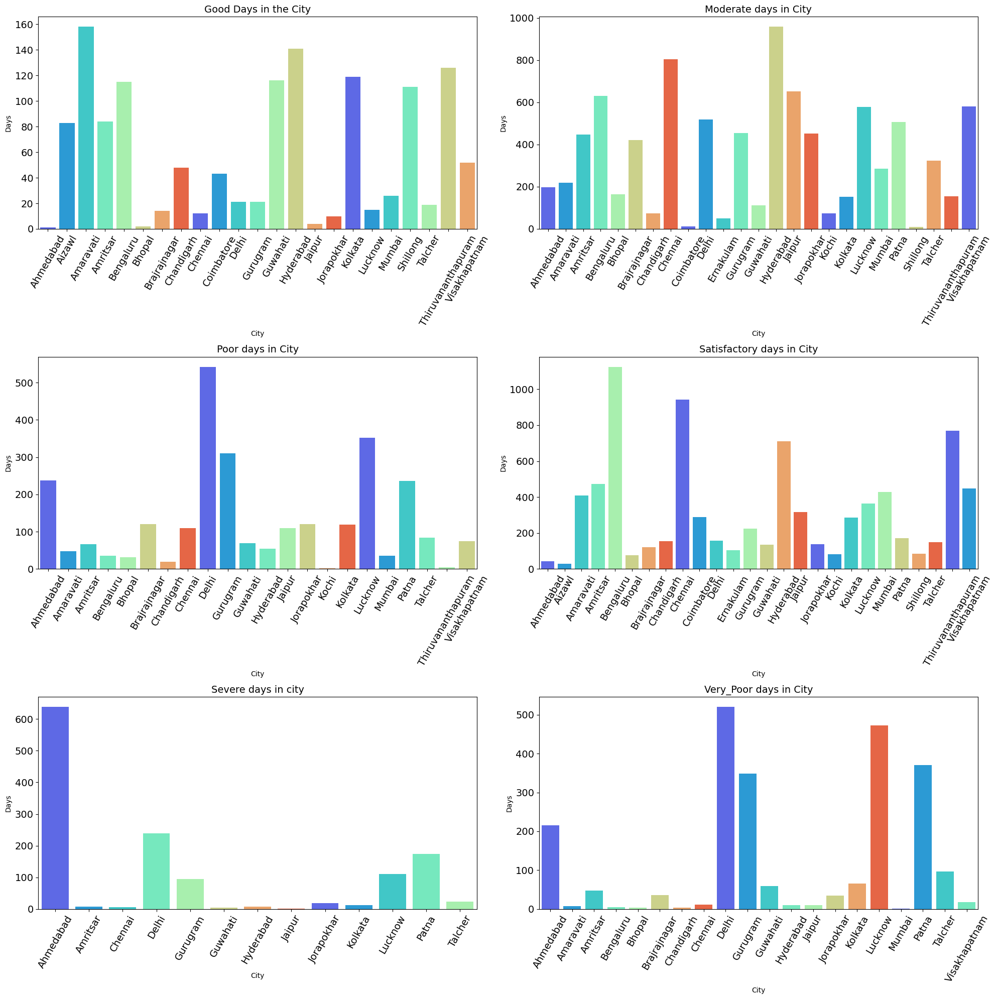

In [34]:
palette = sns.color_palette("rainbow", 8)
plt.figure(figsize=(20,20))
plt.subplot(3,2,1)
sns.barplot(data=good,x=good['City'],y=good['Date'], palette=palette)
plt.xticks(rotation = 60)
plt.xlabel('City'), plt.ylabel('Days')
plt.title("Good Days in the City", fontsize=14), plt.xticks(fontsize=14), plt.yticks(fontsize=14)


plt.subplot(3,2,2)
sns.barplot(data=Moderate,x=Moderate['City'],y=Moderate['Date'], palette=palette)
plt.xticks(rotation = 60)
plt.xlabel('City'), plt.ylabel('Days')
plt.title("Moderate days in City", fontsize=14), plt.xticks(fontsize=14), plt.yticks(fontsize=14)


plt.subplot(3,2,3)
sns.barplot(data=Poor,x=Poor['City'],y=Poor['Date'], palette=palette)
plt.xticks(rotation = 60)
plt.xlabel('City'), plt.ylabel('Days')
plt.title("Poor days in City", fontsize=14), plt.xticks(fontsize=14), plt.yticks(fontsize=14)


plt.subplot(3,2,4)
sns.barplot(data=Satisfactory,x=Satisfactory['City'],y=Satisfactory['Date'], palette=palette)
plt.xticks(rotation = 60)
plt.xlabel('City'), plt.ylabel('Days')
plt.title("Satisfactory days in City", fontsize=14), plt.xticks(fontsize=14), plt.yticks(fontsize=14)


plt.subplot(3,2,5)
sns.barplot(data=Severe,x=Severe['City'],y=Severe['Date'], palette=palette)
plt.xticks(rotation = 60)
plt.xlabel('City'), plt.ylabel('Days')
plt.title("Severe days in city", fontsize=14), plt.xticks(fontsize=14), plt.yticks(fontsize=14)


plt.subplot(3,2,6)
sns.barplot(data=Very_Poor,x=Very_Poor['City'],y=Very_Poor['Date'], palette=palette)
plt.xticks(rotation = 60)
plt.xlabel('City'), plt.ylabel('Days')
plt.title("Very_Poor days in City", fontsize=14), plt.xticks(fontsize=14), plt.yticks(fontsize=14)


plt.tight_layout()
plt.show()

In [35]:
cities=pd.unique(df['City'])

column1=cities+'_AQI'
column2=cities+'_AQI_Bucket'
columns=[*column1,*column2]

In [36]:
final_df=pd.DataFrame(index=np.arange('2015-01-01','2020-07-02',dtype='datetime64[D]'),columns=column1)
for city,i in zip(cities,final_df.columns):
    n=len(np.array(df[df['City']==city]['AQI']))
    final_df[i][-n:]=np.array(df[df['City']==city]['AQI'])

In [37]:
final_df=final_df.astype('float64')
final_df=final_df.resample(rule='MS').mean()

In [38]:
final_df.head()

,Ahmedabad_AQI,Aizawl_AQI,Amaravati_AQI,Amritsar_AQI,Bengaluru_AQI,Bhopal_AQI,Brajrajnagar_AQI,Chandigarh_AQI,Chennai_AQI,Coimbatore_AQI,...,Jorapokhar_AQI,Kochi_AQI,Kolkata_AQI,Lucknow_AQI,Mumbai_AQI,Patna_AQI,Shillong_AQI,Talcher_AQI,Thiruvananthapuram_AQI,Visakhapatnam_AQI
2015-01-01,442.272332,NaN,NaN,NaN,94.318325,NaN,NaN,NaN,114.502654,NaN,...,NaN,NaN,NaN,217.973059,105.352258,NaN,NaN,NaN,NaN,NaN
2015-02-01,513.298886,NaN,NaN,NaN,94.318325,NaN,NaN,NaN,114.502654,NaN,...,NaN,NaN,NaN,217.973059,105.352258,NaN,NaN,NaN,NaN,NaN
2015-03-01,421.818349,NaN,NaN,NaN,107.173113,NaN,NaN,NaN,154.711903,NaN,...,NaN,NaN,NaN,234.401973,105.352258,NaN,NaN,NaN,NaN,NaN
2015-04-01,332.553823,NaN,NaN,NaN,113.733333,NaN,NaN,NaN,173.816755,NaN,...,NaN,NaN,NaN,121.899102,105.352258,NaN,NaN,NaN,NaN,NaN
2015-05-01,269.552353,NaN,NaN,NaN,102.774194,NaN,NaN,NaN,176.129032,NaN,...,NaN,NaN,NaN,137.000000,105.352258,NaN,NaN,NaN,NaN,NaN


In [39]:
final_df['India_AQI']=final_df.mean(axis=1)

In [40]:
final_df.head()

,Ahmedabad_AQI,Aizawl_AQI,Amaravati_AQI,Amritsar_AQI,Bengaluru_AQI,Bhopal_AQI,Brajrajnagar_AQI,Chandigarh_AQI,Chennai_AQI,Coimbatore_AQI,...,Kochi_AQI,Kolkata_AQI,Lucknow_AQI,Mumbai_AQI,Patna_AQI,Shillong_AQI,Talcher_AQI,Thiruvananthapuram_AQI,Visakhapatnam_AQI,India_AQI
2015-01-01,442.272332,NaN,NaN,NaN,94.318325,NaN,NaN,NaN,114.502654,NaN,...,NaN,NaN,217.973059,105.352258,NaN,NaN,NaN,NaN,NaN,203.702342
2015-02-01,513.298886,NaN,NaN,NaN,94.318325,NaN,NaN,NaN,114.502654,NaN,...,NaN,NaN,217.973059,105.352258,NaN,NaN,NaN,NaN,NaN,211.797314
2015-03-01,421.818349,NaN,NaN,NaN,107.173113,NaN,NaN,NaN,154.711903,NaN,...,NaN,NaN,234.401973,105.352258,NaN,NaN,NaN,NaN,NaN,198.439672
2015-04-01,332.553823,NaN,NaN,NaN,113.733333,NaN,NaN,NaN,173.816755,NaN,...,NaN,NaN,121.899102,105.352258,NaN,NaN,NaN,NaN,NaN,184.173752
2015-05-01,269.552353,NaN,NaN,NaN,102.774194,NaN,NaN,NaN,176.129032,NaN,...,NaN,NaN,137.000000,105.352258,NaN,NaN,NaN,NaN,NaN,181.825083


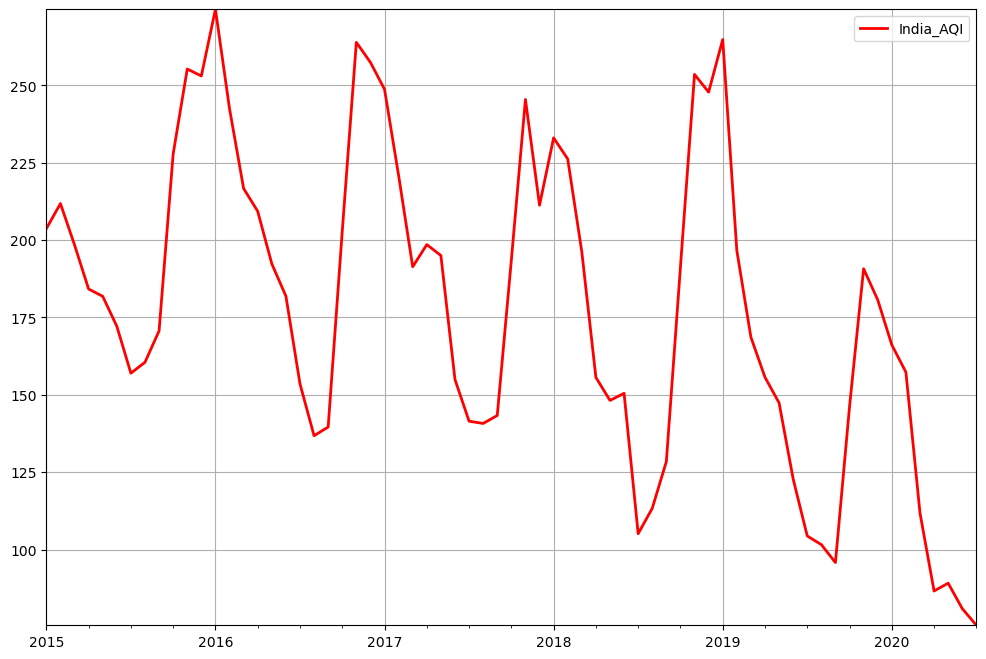

In [41]:
ax=final_df[['India_AQI']].plot(figsize=(12,8),grid=True,lw=2,color='Red')
ax.autoscale(enable=True,axis='both',tight=True)

In [42]:
df_2019=final_df['2019-01-01':'2020-01-01']

In [43]:
df_2019.isna().sum()

Ahmedabad_AQI              0
Aizawl_AQI                13
Amaravati_AQI              0
Amritsar_AQI               0
Bengaluru_AQI              0
Bhopal_AQI                 8
Brajrajnagar_AQI           0
Chandigarh_AQI             8
Chennai_AQI                0
Coimbatore_AQI             5
Delhi_AQI                  0
Ernakulam_AQI             12
Gurugram_AQI               0
Guwahati_AQI               1
Hyderabad_AQI              0
Jaipur_AQI                 0
Jorapokhar_AQI             0
Kochi_AQI                 12
Kolkata_AQI                0
Lucknow_AQI                0
Mumbai_AQI                 0
Patna_AQI                  0
Shillong_AQI               7
Talcher_AQI                0
Thiruvananthapuram_AQI     0
Visakhapatnam_AQI          0
India_AQI                  0
dtype: int64

In [44]:
df_2019=df_2019.drop(['Aizawl_AQI','Ernakulam_AQI','Kochi_AQI'],axis=1)
AQI_2019=df_2019.mean(axis=0)
AQI_2019

Ahmedabad_AQI             498.736861
Amaravati_AQI              97.267343
Amritsar_AQI              109.238316
Bengaluru_AQI              91.991935
Bhopal_AQI                153.002787
Brajrajnagar_AQI          149.376435
Chandigarh_AQI            125.825212
Chennai_AQI               101.903261
Coimbatore_AQI             76.239500
Delhi_AQI                 238.050461
Gurugram_AQI              198.915897
Guwahati_AQI              142.815380
Hyderabad_AQI              94.866377
Jaipur_AQI                119.949486
Jorapokhar_AQI            158.295605
Kolkata_AQI               150.024684
Lucknow_AQI               208.207480
Mumbai_AQI                112.763849
Patna_AQI                 222.322927
Shillong_AQI               50.229011
Talcher_AQI               179.968974
Thiruvananthapuram_AQI     76.385919
Visakhapatnam_AQI         123.192804
India_AQI                 157.032005
dtype: float64

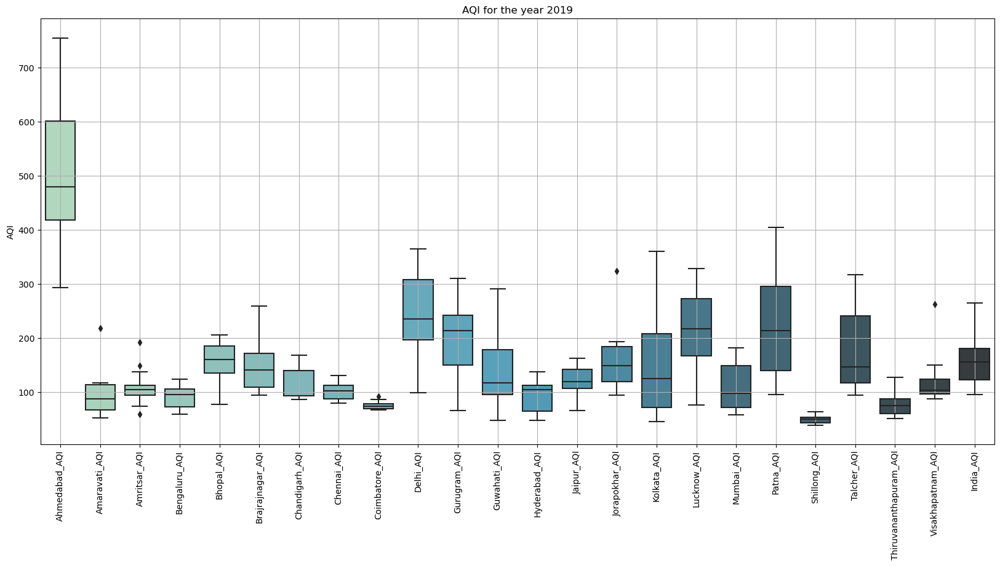

In [45]:
plt.figure(figsize=(20,9))
plt.title('AQI for the year 2019')
plt.xticks(rotation=90)
bplot=sns.boxplot(data=df_2019,width=0.75,palette="GnBu_d")
plt.ylabel('AQI');
bplot.grid(True)

<AxesSubplot:ylabel='AQI'>

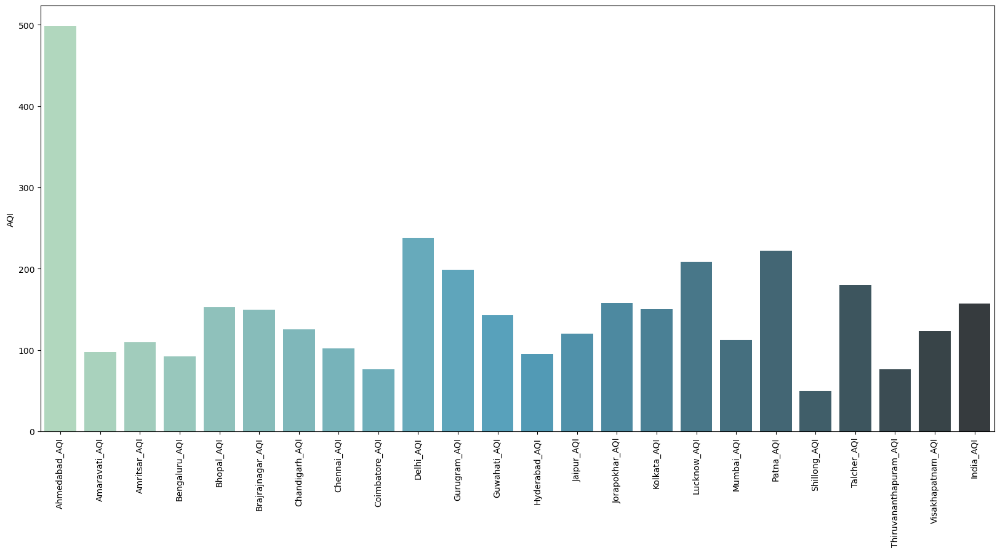

In [46]:
plt.figure(figsize=(20,9))
plt.xticks(rotation=90)
plt.ylabel('AQI')
sns.barplot(AQI_2019.index,AQI_2019.values,palette="GnBu_d")

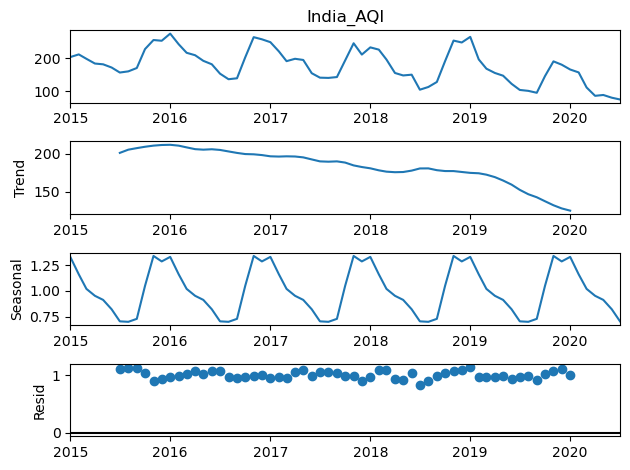

In [49]:
from statsmodels.tsa.seasonal import seasonal_decompose
India_AQI=final_df['India_AQI']
result=seasonal_decompose(India_AQI,model='multiplicative')
result.plot();

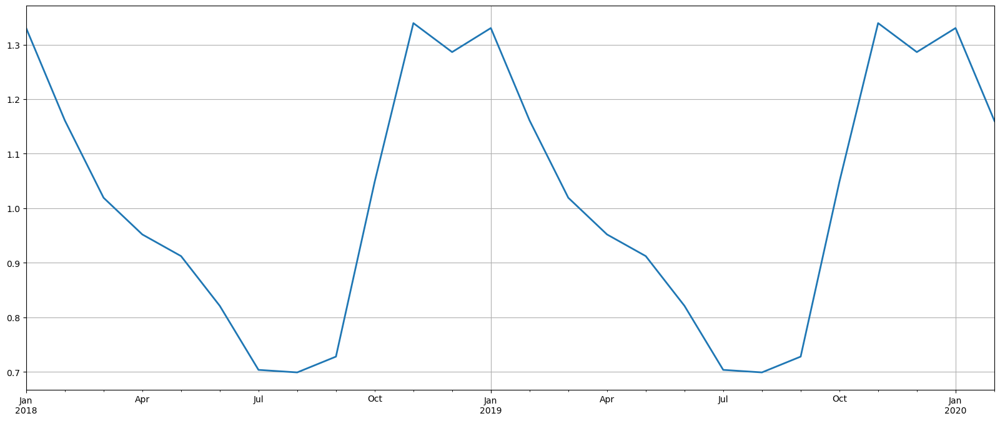

In [50]:
from matplotlib import dates
ax=result.seasonal.plot(xlim=['2018-01-01','2020-02-10'],figsize=(20,8),lw=2)
ax.yaxis.grid(True)
ax.xaxis.grid(True)

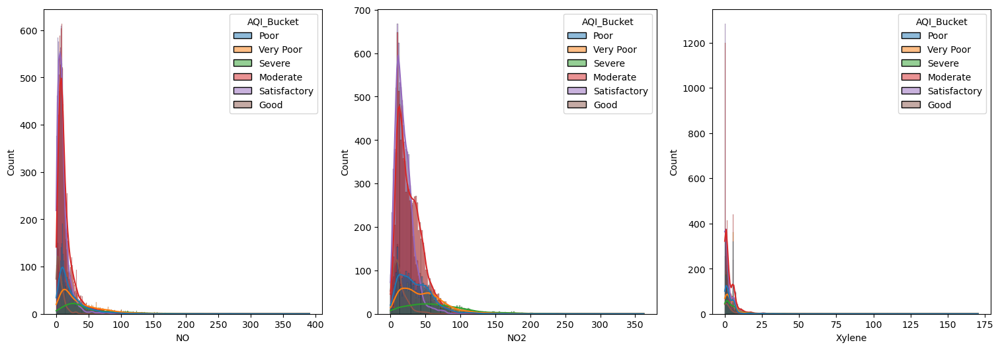

In [52]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(141)
sns.histplot(data=df,x='NO',kde=True,hue='AQI_Bucket')
plt.subplot(142)
sns.histplot(data=df,x='NO2',kde=True,hue='AQI_Bucket')
plt.subplot(143)
sns.histplot(data=df,x='Xylene',kde=True,hue='AQI_Bucket')
plt.show()

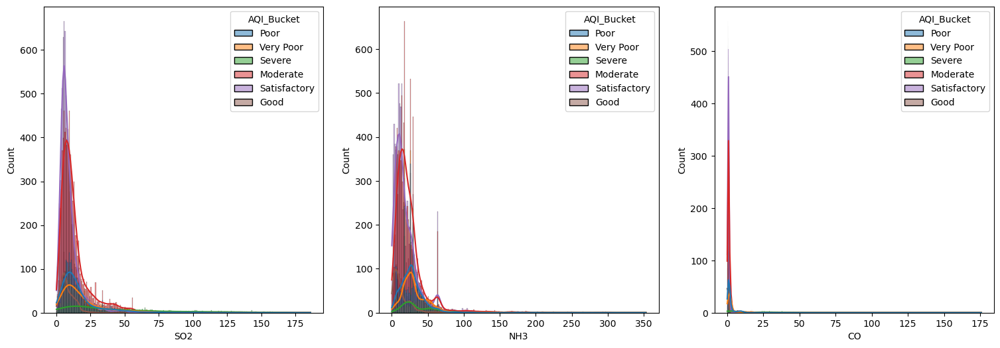

In [53]:
plt.subplots(1,3,figsize=(25,6))
plt.subplot(141)
sns.histplot(data=df,x='SO2',kde=True,hue='AQI_Bucket')
plt.subplot(142)
sns.histplot(data=df,x='NH3',kde=True,hue='AQI_Bucket')
plt.subplot(143)
sns.histplot(data=df,x='CO',kde=True,hue='AQI_Bucket')
plt.show()

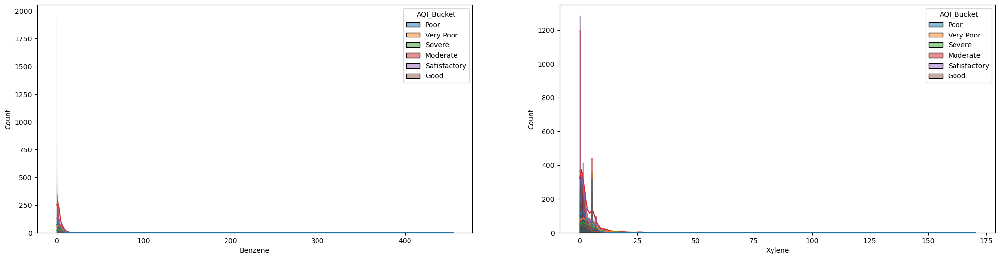

In [54]:
plt.subplots(1,2,figsize=(25,6))
plt.subplot(121)
sns.histplot(data=df,x='Benzene',kde=True,hue='AQI_Bucket')
plt.subplot(122)
sns.histplot(data=df,x='Xylene',kde=True,hue='AQI_Bucket')
plt.show()

In [55]:
df.head().style.background_gradient(cmap = "autumn")

,City,Date,PM2.5,PM10,NO,NO2,NH3,CO,SO2,O3,Benzene,Xylene,AQI,AQI_Bucket
0,Ahmedabad,2015-01-01 00:00:00,67.854497,114.584029,0.920000,18.220000,nan,0.920000,27.640000,133.360000,0.000000,0.000000,452.122939,nan
1,Ahmedabad,2015-01-02 00:00:00,67.854497,114.584029,0.970000,15.690000,nan,0.970000,24.550000,34.060000,3.680000,3.770000,452.122939,nan
2,Ahmedabad,2015-01-03 00:00:00,67.854497,114.584029,17.400000,19.300000,nan,17.400000,29.070000,30.700000,6.800000,2.250000,452.122939,nan
3,Ahmedabad,2015-01-04 00:00:00,67.854497,114.584029,1.700000,18.480000,nan,1.700000,18.590000,36.080000,4.430000,1.000000,452.122939,nan
4,Ahmedabad,2015-01-05 00:00:00,67.854497,114.584029,22.100000,21.420000,nan,22.100000,39.330000,39.310000,7.010000,2.780000,452.122939,nan


### 📈Step 4) Training a Regression Model

#### 1) Data Preparation

DataPreparation: 
The data preparation process entails cleaning as well as preparation of raw data from the business understanding 4.2.3 Data preprocessing Initially the data set contains noisy, inconsistent data and missing values. The data has to be preprocessed to remove the unwanted data and to make the data useful. Data preprocessing helps to transform data into useful format. The following steps were involved in data preprocessing. 
1) Data cleaning 

2) Data reduction

3) Data transformation 


In [56]:
reg_df=df.copy()

In [57]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()

In [58]:
reg_df.drop(['City','Date','AQI_Bucket'],axis=1,inplace=True)

In [59]:
reg_df.dropna(inplace=True)

In [60]:
X=reg_df.drop('AQI',axis=1)
y=reg_df['AQI']

In [61]:
X=sc.fit_transform(X)

#### 2)Training and testing the model:

Firstly, we’ve collected the data set from kaggle. Then we performed data preprocessing techniques like data cleaning, data reduction on the data. At first the data related to the city Delhi is extracted. After that all the tuples which has missing values were ignored. Further data cleaning is performed for better and accurate results. Then data is split into two parameters which contains air particles composition in one parameter and AQI data in other parameter. We’ve considered PM 2.5, PM 10 and NO2 variables for predicting the AQI variable. 

In [62]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2,random_state=42)
X_train.shape, X_test.shape

((11450, 10), (2863, 10))

In [63]:
def evaluate_model(true, predicted):
    mae = mean_absolute_error(true, predicted)
    mse = mean_squared_error(true, predicted)
    rmse = np.sqrt(mean_squared_error(true, predicted))
    r2_square = r2_score(true, predicted)
    return mae, rmse, r2_square

In [64]:
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.linear_model import LinearRegression, Ridge,Lasso
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import RandomizedSearchCV
from catboost import CatBoostRegressor
from sklearn.ensemble import BaggingRegressor
from xgboost import XGBRegressor
import warnings

In [65]:
models = {
    "Linear Regression": LinearRegression(),
    "SVR": SVR(kernel='linear'),
    "K-Neighbors Regressor": KNeighborsRegressor(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest Regressor": RandomForestRegressor(),
    "XGBRegressor": XGBRegressor(), 
    "CatBoosting Regressor": CatBoostRegressor(verbose=False),
    "AdaBoost Regressor": AdaBoostRegressor(),
    "BaggingRegressor": BaggingRegressor(base_estimator=DecisionTreeRegressor())
}
model_list = []
r2_list =[]

for i in range(len(list(models))):
    model = list(models.values())[i]
    model.fit(X_train, y_train) # Train model

    # Make predictions
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)
    
    # Evaluate Train and Test dataset
    model_train_mae , model_train_rmse, model_train_r2 = evaluate_model(y_train, y_train_pred)

    model_test_mae , model_test_rmse, model_test_r2 = evaluate_model(y_test, y_test_pred)

    
    print(list(models.keys())[i])
    model_list.append(list(models.keys())[i])
    
    print('Model performance for Training set')
    print("- Root Mean Squared Error: {:.4f}".format(model_train_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_train_mae))
    print("- R2 Score: {:.4f}".format(model_train_r2))

    print('----------------------------------')
    
    print('Model performance for Test set')
    print("- Root Mean Squared Error: {:.4f}".format(model_test_rmse))
    print("- Mean Absolute Error: {:.4f}".format(model_test_mae))
    print("- R2 Score: {:.4f}".format(model_test_r2))
    r2_list.append(model_test_r2)
    
    print('='*35)
    print('\n')

Linear Regression
Model performance for Training set
- Root Mean Squared Error: 42.8817
- Mean Absolute Error: 26.8810
- R2 Score: 0.8376
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 39.6950
- Mean Absolute Error: 26.3447
- R2 Score: 0.8545


SVR
Model performance for Training set
- Root Mean Squared Error: 45.3051
- Mean Absolute Error: 24.8183
- R2 Score: 0.8187
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 41.6305
- Mean Absolute Error: 24.5486
- R2 Score: 0.8399


K-Neighbors Regressor
Model performance for Training set
- Root Mean Squared Error: 27.7903
- Mean Absolute Error: 15.8316
- R2 Score: 0.9318
----------------------------------
Model performance for Test set
- Root Mean Squared Error: 32.6091
- Mean Absolute Error: 19.2549
- R2 Score: 0.9018


Decision Tree
Model performance for Training set
- Root Mean Squared Error: 3.8492
- Mean Absolute Error: 0.1983
- R2 Score: 0.9987
-----

### ▶️Model Evaluation

#### Cross-validation
###### What is cross-validation?

In cross-validation, we run our modeling process on different subsets of the data to get multiple measures of model quality.

###### When should you use cross-validation?

Cross-validation gives a more accurate measure of model quality, which is especially important if you are making a lot of modeling decisions. However, it can take longer to run, because it estimates multiple models (one for each fold).

So, given these tradeoffs, when should you use each approach?

For small datasets, where extra computational burden isn't a big deal, you should run cross-validation.
For larger datasets, a single validation set is sufficient. Your code will run faster, and you may have enough data that there's little need to re-use some of it for holdout.
There's no simple threshold for what constitutes a large vs. small dataset. But if your model takes a couple minutes or less to run, it's probably worth switching to cross-validation.

Alternatively, you can run cross-validation and see if the scores for each experiment seem close. If each experiment yields the same results, a single validation set is probably sufficient.


### 🧪Regression Evaluation Metrics

#### Here are three common evaluation metrics for regression problems:

Mean Absolute Error (MAE) is the mean of the absolute value of the errors:
    

Mean Squared Error (MSE) is the mean of the squared errors:
    

Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:
    

In [66]:
pd.DataFrame(list(zip(model_list, r2_list)), columns=['Model Name', 'R2_Score']).sort_values(by=["R2_Score"],ascending=False)

,Model Name,R2_Score
6,CatBoosting Regressor,0.926609
4,Random Forest Regressor,0.919742
5,XGBRegressor,0.918325
8,BaggingRegressor,0.914536
2,K-Neighbors Regressor,0.901799
0,Linear Regression,0.854484
3,Decision Tree,0.846606
1,SVR,0.839948
7,AdaBoost Regressor,0.752195


In [70]:
lin_model =CatBoostRegressor(verbose=False)
lin_model = lin_model.fit(X_train, y_train)
y_pred = lin_model.predict(X_test)
score = r2_score(y_test, y_pred)*100
print(" Accuracy of the model is %.2f" %score)

 Accuracy of the model is 92.66


In [71]:
evaluate_model(y_pred,y_test)

(16.49143016045559, 28.19051627495987, 0.9219224613473123)

In [69]:
pred_df=pd.DataFrame({'Actual Value':y_test,'Predicted Value':y_pred,'Difference':y_test-y_pred})
pred_df

,Actual Value,Predicted Value,Difference
13885,352.0,328.141447,23.858553
13355,216.0,260.596581,-44.596581
10415,298.0,192.092259,105.907741
13055,238.0,221.245698,16.754302
16164,118.0,116.962683,1.037317
...,...,...,...
15570,54.0,62.332375,-8.332375
15284,109.0,100.915933,8.084067
28578,95.0,129.058368,-34.058368
19655,295.0,282.027409,12.972591


### ▶️Improve model

From the above inference,we found CatBoostRegressor shows best R2 score whith high level of accuracy.The ﬁnal step in the process of appliedmachine learning before presenting results is algorithm tuning.It is sometimes called Hyperparameter optimization wherethe algorithm parameters are referred to as hyperparameterswhereas the coefﬁcients found by the machine learning al-gorithm itself are referred to as parameters. Optimizationsuggests the search-nature of the problem. There are differentsearch strategies to ﬁnd a good and robust parameter or set of parameters for an algorithm on a given problem. The onethat this paper focuses is Grid Search CV. Grid search is anapproach to parameter tuning that will methodically build andevaluate a model for each combination of algorithm parametersspeciﬁed in a grid. 

#### A. Estimator:

This is used to implement scikit-learn estimator inter-face.The classiﬁer that is to be trained is passed to thisparameter.

#### B. Parameter grid:

A python dictionary with parameter names as keys and listof parameter settings as values. All the combinations of theseparameters are tested to check the best accurac

In [49]:
from sklearn.model_selection import GridSearchCV
param_grid = {
    'depth': [4, 6, 8],                     # Tree depth
    'learning_rate': [0.1, 0.01, 0.001],     # Learning rate
    'iterations': [100, 200, 300],           # Number of boosting iterations
    'l2_leaf_reg': [1, 3, 5],                # L2 regularization coefficient
    'random_seed': [42]                      # Random seed for reproducibility
}




In [50]:
catboost_model = CatBoostRegressor()
grid_search = GridSearchCV(estimator=catboost_model, param_grid=param_grid, cv=5)
grid_search.fit(X_train, y_train)

0:	learn: 97.5056012	total: 4.9ms	remaining: 485ms
1:	learn: 90.0476249	total: 9.64ms	remaining: 472ms
2:	learn: 83.4063342	total: 14.1ms	remaining: 457ms
3:	learn: 77.5351313	total: 18.2ms	remaining: 437ms
4:	learn: 72.4323417	total: 22.8ms	remaining: 433ms
5:	learn: 67.7935310	total: 27.3ms	remaining: 428ms
6:	learn: 63.5362202	total: 31.5ms	remaining: 418ms
7:	learn: 59.8612233	total: 36.9ms	remaining: 425ms
8:	learn: 56.6533281	total: 42.4ms	remaining: 428ms
9:	learn: 53.9526061	total: 49.7ms	remaining: 447ms
10:	learn: 51.3613680	total: 55.7ms	remaining: 450ms
11:	learn: 49.2607509	total: 59.7ms	remaining: 438ms
12:	learn: 47.4731484	total: 64ms	remaining: 429ms
13:	learn: 45.8203331	total: 70.3ms	remaining: 432ms
14:	learn: 44.2748840	total: 77.3ms	remaining: 438ms
15:	learn: 43.0819078	total: 84.4ms	remaining: 443ms
16:	learn: 41.9279112	total: 90.8ms	remaining: 443ms
17:	learn: 41.0205207	total: 97.8ms	remaining: 446ms
18:	learn: 40.2281745	total: 104ms	remaining: 444ms
19:	lea

GridSearchCV(cv=5,
             estimator=<catboost.core.CatBoostRegressor object at 0x0000022A41A6EDC0>,
             param_grid={'depth': [4, 6, 8], 'iterations': [100, 200, 300],
                         'l2_leaf_reg': [1, 3, 5],
                         'learning_rate': [0.1, 0.01, 0.001],
                         'random_seed': [42]})

In [51]:
print("Best Hyperparameters:", grid_search.best_params_)

Best Hyperparameters: {'depth': 8, 'iterations': 300, 'l2_leaf_reg': 1, 'learning_rate': 0.1, 'random_seed': 42}


In [52]:
clfR = CatBoostRegressor(depth=8, iterations=300, l2_leaf_reg= 1, learning_rate= 0.1, random_seed= 42)
clfR.fit(X_train,y_train)

0:	learn: 97.5419429	total: 25.3ms	remaining: 7.55s
1:	learn: 89.6290539	total: 61.2ms	remaining: 9.12s
2:	learn: 82.5337097	total: 87.9ms	remaining: 8.7s
3:	learn: 76.2923774	total: 110ms	remaining: 8.11s
4:	learn: 70.7735444	total: 130ms	remaining: 7.68s
5:	learn: 65.8532703	total: 153ms	remaining: 7.49s
6:	learn: 61.4528467	total: 176ms	remaining: 7.36s
7:	learn: 57.5092605	total: 199ms	remaining: 7.26s
8:	learn: 53.9932850	total: 236ms	remaining: 7.63s
9:	learn: 51.0457864	total: 267ms	remaining: 7.73s
10:	learn: 48.4262249	total: 289ms	remaining: 7.59s
11:	learn: 46.1445130	total: 318ms	remaining: 7.64s
12:	learn: 44.1016749	total: 344ms	remaining: 7.59s
13:	learn: 42.4490193	total: 365ms	remaining: 7.45s
14:	learn: 40.9742910	total: 388ms	remaining: 7.37s
15:	learn: 39.5931579	total: 414ms	remaining: 7.35s
16:	learn: 38.3369384	total: 434ms	remaining: 7.23s
17:	learn: 37.2804743	total: 456ms	remaining: 7.15s
18:	learn: 36.2976885	total: 483ms	remaining: 7.14s
19:	learn: 35.548849

In [53]:
y_pred = clfR.predict(X_test)
score = r2_score(y_test, y_pred)*100
print(" Accuracy of the model is %.2f" %score)

 Accuracy of the model is 92.63


In [54]:
evaluate_model(y_pred,y_test)

(16.489579226103388, 28.257641100592977, 0.9215371390153195)

In [55]:
from sklearn import metrics 
print ("MAE:", metrics.mean_absolute_error (y_test, y_pred))

print ("RMSE:", np.sqrt(metrics.mean_squared_error (y_test, y_pred)))

MAE: 16.489579226103388
RMSE: 28.257641100592977


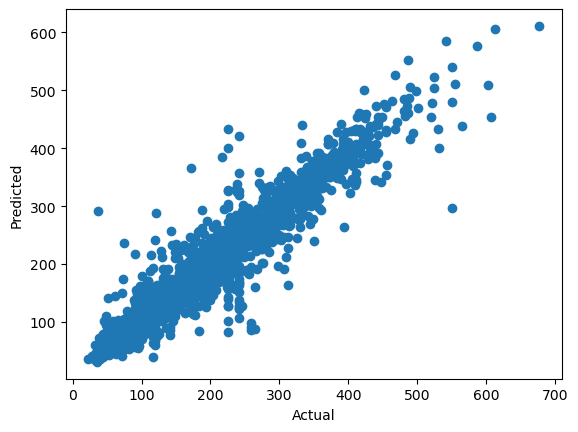

In [56]:
plt.scatter(y_test,y_pred);
plt.xlabel('Actual');
plt.ylabel('Predicted');

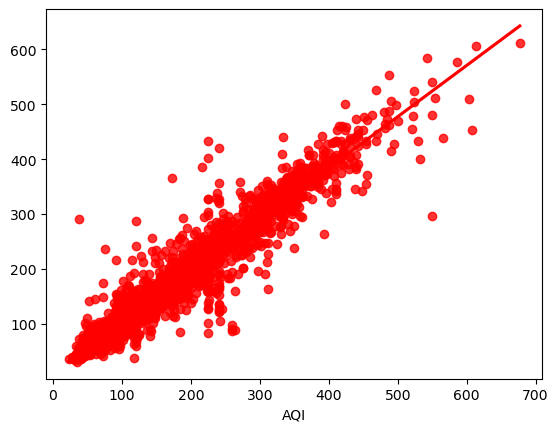

In [57]:
sns.regplot(x=y_test,y=y_pred,ci=None,color ='red');

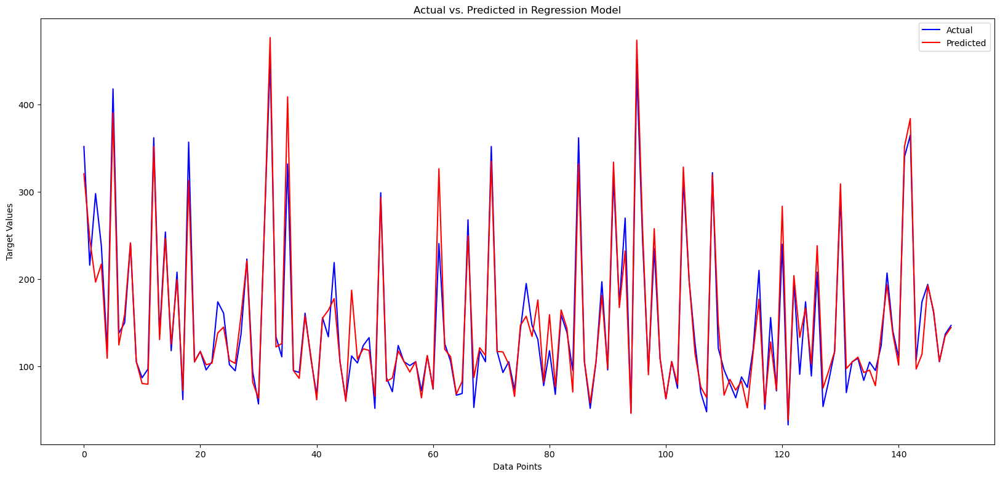

In [68]:
# Create an array of indices to use as the x-axis (assuming sequential data)

plt.figure(figsize=(20,9))
x = range(len(y_test[:150]))

# Plot the actual target values in blue
plt.plot(x, y_test[:150], label='Actual', color='blue')

# Plot the predicted values in red
plt.plot(x, y_pred[:150], label='Predicted', color='red')

# Add labels and title
plt.xlabel('Data Points')
plt.ylabel('Target Values')
plt.title('Actual vs. Predicted in Regression Model')

# Show legend
plt.legend()

# Show the plot
plt.show()